In [2]:
import torch
import numpy as np
import time
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import simple_dvo.dataset.datautils as datautils

In [2]:
K = np.eye(3)
K[0, 0] = 2
K[0, 2] = 3
K[1, 1] = 4
K[1, 2] = 5
print(K)

[[2. 0. 3.]
 [0. 4. 5.]
 [0. 0. 1.]]


In [3]:
K_np = np.expand_dims(K.copy(), 0)
print(K_np.shape)
s = time.time()
K_np_scaled = datautils.scale_intrinsics(K_np, 0.3, 0.3)
print(time.time()- s, K_np_scaled)

(1, 3, 3)
(1, 3)
9.34600830078125e-05 [[[0.6 0.  0.9]
  [0.  1.2 1.5]
  [0.  0.  1. ]]]


In [4]:
K_tensor = torch.from_numpy(K).float()
K_tensor = K_tensor.unsqueeze(0)
s = time.time()
K_tensor_scaled = datautils.scale_intrinsics(K_tensor, 0.3, 0.3)
print(time.time() - s, K_tensor_scaled)

0.0002970695495605469 tensor([[[0.6000, 0.0000, 0.9000],
         [0.0000, 1.2000, 1.5000],
         [0.0000, 0.0000, 1.0000]]])


In [5]:
K = torch.from_numpy(np.expand_dims(K, 0))
S = time.time()
print(K)
ratio = torch.ones(K.size(1), K.size(0))
ratio[0, :] = 10
ratio[1, :] = 20
new_K = K * ratio
print(time.time() - S)

tensor([[[2., 0., 3.],
         [0., 4., 5.],
         [0., 0., 1.]]], dtype=torch.float64)
0.0012404918670654297


In [6]:
s = time.time()
K[..., 0, 0] *= 10  # fx
K[..., 1, 1] *= 20  # fy
K[..., 0, 2] *= 10  # cx
K[..., 1, 2] *= 20  # cy
print(time.time() - S)

1.4431402683258057


In [27]:
a = np.arange(16).reshape(1, 4, 4)
print([a.shape[:-1], a.shape[-1]])

[(1, 4), 4]


In [1]:
import torch
import numpy as np
import time
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import simple_dvo.dataset.datautils as datautils

from simple_dvo.dataset.cofusion import CoFusion
from simple_dvo import RGBFrames, RGBDFrames
import numpy as np
import matplotlib.pyplot as plt
import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
import torch
from torch.utils.data import DataLoader

import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
data_dir = "/home/jingkun/Dataset/CoFusion/room4-full/"

dataset = CoFusion(basedir=data_dir, depth_ext='exr', sequence_length=200, height=240, width=320)

loader = DataLoader(dataset=dataset, batch_size=1)
iterator = iter(loader)
# next(iterator)
colors, intensities, depths, poses, intrinsics, *_ =next(iterator)

In [3]:
print(f"colors shape: {colors.shape}")  # torch.Size([2, 8, 240, 320, 3])
print(f"intensities shape: {intensities.shape}")  # torch.Size([2, 8, 240, 320, 1])
print(f"depths shape: {depths.shape}")  # torch.Size([2, 1, 4, 4])
print(f"poses shape: {poses.shape}")  # torch.Size([2, 8, 4, 4])
print(f"intrinsics shape: {intrinsics.shape}")  # torch.Size([2, 1, 4, 4])
print('---')

colors shape: torch.Size([1, 200, 240, 320, 3])
intensities shape: torch.Size([1, 200, 240, 320, 1])
depths shape: torch.Size([1, 200, 240, 320, 1])
poses shape: torch.Size([1, 200, 4, 4])
intrinsics shape: torch.Size([1, 1, 4, 4])
---


In [4]:
frames = RGBDFrames(colors, depths, intrinsics, intensities, poses)

print(frames.shape)

frames.plotly(0).show()

(1, 200, 240, 320)


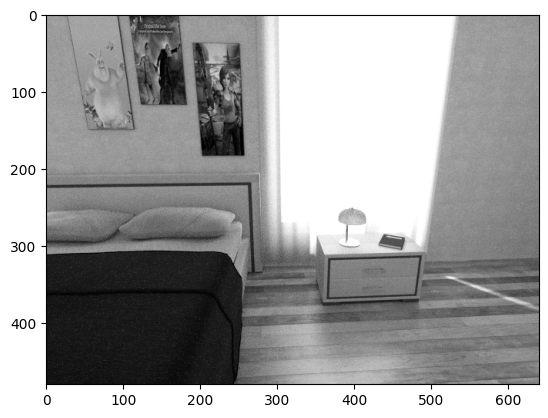

In [18]:
rgb_frame = intensities[0, 1, ...].squeeze().numpy()
import cv2 as cv

plt.imshow(cv.normalize(rgb_frame, None, 0, 1, cv.NORM_MINMAX), cmap='gray')